In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torchvision
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import itertools
import random

from torch.autograd import Variable
from torchvision import datasets, transforms
from PIL import Image

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

DATA = {
    'data': 'drive/My Drive/GAN/horse2zebra/horse2zebra',
    'trainA':'drive/My Drive/GAN/horse2zebra/horse2zebra/train_horse',
    'testA':'drive/My Drive/GAN/horse2zebra/horse2zebra/testA',
    'trainB':'drive/My Drive/GAN/horse2zebra/horse2zebra/train_zebra',
    'testB':'drive/My Drive/GAN/horse2zebra/horse2zebra/testB'
}

cpu


In [3]:
IMG_SIZE = 256
normalize = transforms.Normalize(
    mean = (0.485, 0.456, 0.406),
    std = (0.229, 0.224, 0.225)
)


transforms_train = transforms.Compose([
                                       transforms.Resize((IMG_SIZE,IMG_SIZE)),
                                       transforms.CenterCrop((IMG_SIZE, IMG_SIZE)),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.RandomRotation(10),
                                       transforms.ToTensor(),
                                       normalize
])

transforms_test = transforms.Compose([
                                       transforms.Resize((IMG_SIZE, IMG_SIZE)),
                                       transforms.CenterCrop((IMG_SIZE, IMG_SIZE)),
                                       transforms.ToTensor(),
                                       normalize
])

In [4]:
trainA_dataset = datasets.ImageFolder(DATA['trainA'],transform = transforms_train)
trainB_dataset = datasets.ImageFolder(DATA['trainB'],transform = transforms_train)

trainA_dataloader = data.DataLoader(trainA_dataset, batch_size = 1, shuffle = True, num_workers = 4)
trainB_dataloader = data.DataLoader(trainB_dataset, batch_size = 1, shuffle = True, num_workers = 4)

In [5]:
print('Number of horse: ',len(trainA_dataset))
print('Number of zebra: ',len(trainB_dataset))

Number of horse:  1067
Number of zebra:  1334


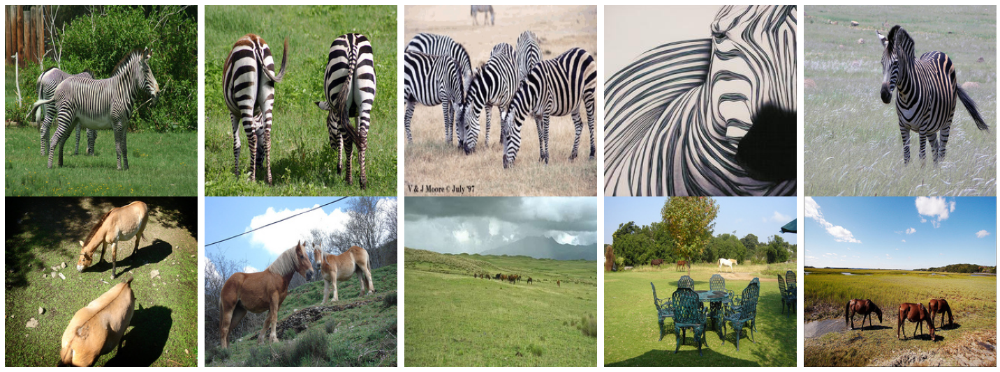

In [6]:
def visualize_data(data):
    rand = np.random.randint(1000)
    fig = plt.figure(figsize=(20,15))

    pathA_join = os.path.join(data, 'train_horse/trainA')
    pathA = os.listdir(pathA_join)
    for id, img in enumerate(pathA[rand : rand + 5]):
        path = os.path.join(pathA_join, img)
        img = Image.open(path)
        fig.add_subplot(1,5, id + 1)
        plt.imshow(img)
        plt.axis("off")

    pathB_join = os.path.join(data, 'train_zebra/trainB')
    pathB = os.listdir(pathB_join)
    for id, img in enumerate(pathB[rand : rand + 5]):
        path = os.path.join(pathB_join, img)
        img = Image.open(path)
        fig.add_subplot(2,5, id + 1)
        plt.imshow(img)
        plt.axis("off")
        
    plt.tight_layout() 
    plt.show()

visualize_data(DATA['data'])

# MODEL

In [7]:
class ResnetBlock(nn.Module):
    def __init__(self, in_features):
        super(ResnetBlock,self).__init__()

        self.conv_block = nn.Sequential(
            nn.Conv2d(in_features, in_features, kernel_size= 3, stride = 1, padding =1),
            nn.InstanceNorm2d(in_features),
            nn.ReLU(inplace = True),
            nn.Conv2d(in_features, in_features, kernel_size= 3, stride = 1, padding =1),
            nn.InstanceNorm2d(in_features)
        )

    def forward(self, x):
        return x + self.conv_block(x)

In [8]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        
        # encoder
        self.hidden0 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, stride=1, padding=3),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.hidden1 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True)
        )
        self.hidden2 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True)
        )
        
        # transformer
        num_res_blocks = 9
        conv_layers = []
        for i in range(num_res_blocks):
            conv_layers.append(ResnetBlock(256))
        self.res_blocks = nn.Sequential(*conv_layers)
        
        # decoder
        self.hidden3 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True)
        )
        self.hidden4 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.hidden5 = nn.Sequential(
            nn.ConvTranspose2d(64, 3, kernel_size=7, stride=1, padding=3),
            nn.Tanh()
        )
        
    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)

        x = self.res_blocks(x)

        x = self.hidden3(x)
        x = self.hidden4(x)
        x = self.hidden5(x)

        return x

In [9]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.hidden0 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(64),
            nn.LeakyReLU(.2, inplace=True)
        )
        self.hidden1 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(.2, inplace=True),
        )
        self.hidden2 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(.2, inplace=True)
        )
        self.hidden3 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(.2, inplace=True),
        )
        self.out = nn.Sequential(
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1)
        )
        
    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.hidden3(x)
        
        x = self.out(x)
        return x

In [10]:
# Label Smoothing
def label_generate(label, size):
    if label == 1:
        data = torch.ones(size) - 0.1
    
    elif label == 0:
        data = torch.zeros(size) 
    
    data = Variable(data).to(device)

    return data

In [11]:
class ReplayBuffer():
    def __init__(self, max_size=50):
        assert (max_size > 0), 'Empty buffer or trying to create a black hole. Be careful.'
        self.max_size = max_size
        self.data = []

    def push_and_pop(self, data):
        to_return = []
        for element in data.data:
            element = torch.unsqueeze(element, 0)
            if len(self.data) < self.max_size:
                self.data.append(element)
                to_return.append(element)
            else:
                if random.uniform(0,1) > 0.5:
                    i = random.randint(0, self.max_size-1)
                    to_return.append(self.data[i].clone())
                    self.data[i] = element
                else:
                    to_return.append(element)
        return Variable(torch.cat(to_return))

In [12]:
fake_A_buffer = ReplayBuffer(100)
fake_B_buffer = ReplayBuffer(100)

In [13]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2d') != -1:
        torch.nn.init.normal(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant(m.bias.data, 0.0)

In [14]:
G_A2B = Generator().to(device)
G_B2A = Generator().to(device)
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

# G_A2B.apply(weights_init_normal)
# G_B2A.apply(weights_init_normal)
# D_A.apply(weights_init_normal)
# D_B.apply(weights_init_normal)


In [15]:
criterion_GAN = nn.MSELoss().to(device)
criterion_cycle = nn.L1Loss().to(device)
# criterion_identity = nn.L1Loss()

In [16]:
optimizer_G = torch.optim.Adam(itertools.chain(G_A2B.parameters(),G_B2A.parameters()),
                               lr = 0.0002 , betas = (0.5, 0.999))
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr = 0.0002, betas = (0.5, 0.999))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr = 0.0002, betas = (0.5, 0.999))


In [17]:
print(len(trainB_dataloader))

1334


In [18]:
# Inputs & targets memory allocation
"""
batchSize = 1
input_nc =  3
output_nc = 3
size = 256

Tensor = torch.cuda.FloatTensor
input_A = Tensor(batchSize, input_nc, size, size)
input_B = Tensor(batchSize, output_nc, size, size)
target_real = Variable(Tensor(batchSize).fill_(1.0), requires_grad=False)
target_fake = Variable(Tensor(batchSize).fill_(0.0), requires_grad=False)
"""

'\nbatchSize = 1\ninput_nc =  3\noutput_nc = 3\nsize = 256\n\nTensor = torch.cuda.FloatTensor\ninput_A = Tensor(batchSize, input_nc, size, size)\ninput_B = Tensor(batchSize, output_nc, size, size)\ntarget_real = Variable(Tensor(batchSize).fill_(1.0), requires_grad=False)\ntarget_fake = Variable(Tensor(batchSize).fill_(0.0), requires_grad=False)\n'

In [19]:
def imshow(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_show = img.cpu().numpy().squeeze().transpose((1, 2, 0))
    img_show = (img_show * std + mean)
    img_show = np.clip(img_show, 0, 1)
    return img_show

In [20]:
def visualize_train_process(G_A2B, G_B2A, img, domain):
    G_A2B.eval()
    G_B2A.eval()

    img = Variable(transforms_test(img)).view(-1, 3, IMG_SIZE, IMG_SIZE).to(device)

    with torch.no_grad():
        img_show = imshow(img)
        if domain == 'A':
            fake = G_A2B(img)
            fake_show = imshow(fake)
            reconstructed = G_B2A(fake)
            reconstructed_show = imshow(reconstructed)
        else:
            fake = G_B2A(img)
            fake_show = imshow(fake)
            reconstructed = G_A2B(fake)
            reconstructed_show = imshow(reconstructed)

    fig = plt.figure(figsize=(30,10))
    plt.axis("off")
    fig.add_subplot(1,3,1)
    plt.axis("off")
    plt.title("Real Image")
    plt.imshow(img_show)
    fig.add_subplot(1,3,2)
    plt.axis("off")
    plt.title("Generated Fake Image")
    plt.imshow(fake_show)
    fig.add_subplot(1,3,3)
    plt.axis("off")
    plt.title("Reconstructed Real Image")
    plt.imshow(reconstructed_show)
    plt.show()
    
    G_A2B.train()
    G_B2A.train()


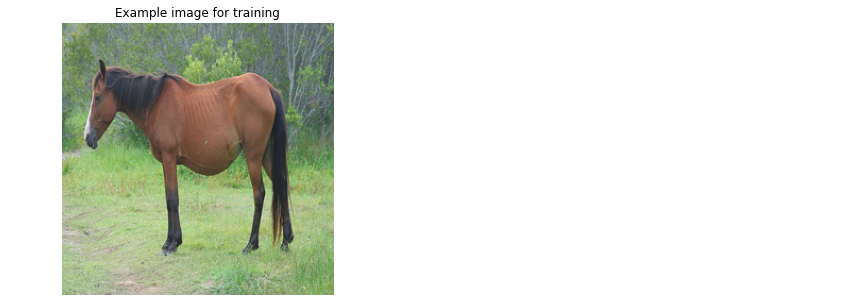

In [21]:
example_img = Image.open('drive/My Drive/GAN/horse2zebra/horse2zebra/testA/n02381460_4530.jpg')
fig = plt.figure(figsize=(15,5))
plt.axis("off")
fig.add_subplot(1,2,1)
plt.axis("off")
plt.title("Example image for training")
plt.imshow(example_img)

plt.show()

!-------------- Start Traning ---------------!
Epoch: (1/50) | Batch: (1/1067) | D_A_Loss: 4.2436 D_B_Loss: 7.2361 | G_A_Loss: 1.3115 G_B_Loss: 0.7182 | C_A_Loss: 8.1154 C_B_Loss: 10.7228 |
Epoch: (1/50) | Batch: (251/1067) | D_A_Loss: 1.8124 D_B_Loss: 0.4563 | G_A_Loss: 0.3886 G_B_Loss: 0.5826 | C_A_Loss: 4.2784 C_B_Loss: 7.5827 |
Epoch: (1/50) | Batch: (501/1067) | D_A_Loss: 0.7568 D_B_Loss: 0.7684 | G_A_Loss: 0.3295 G_B_Loss: 0.4786 | C_A_Loss: 8.1549 C_B_Loss: 6.1852 |
Epoch: (1/50) | Batch: (751/1067) | D_A_Loss: 0.4968 D_B_Loss: 0.2614 | G_A_Loss: 0.2870 G_B_Loss: 0.2876 | C_A_Loss: 4.5906 C_B_Loss: 5.6304 |
Epoch: (1/50) | Batch: (1001/1067) | D_A_Loss: 0.4173 D_B_Loss: 0.3724 | G_A_Loss: 0.4878 G_B_Loss: 0.5455 | C_A_Loss: 4.1842 C_B_Loss: 6.7208 |
Epoch: (1/50) | Batch: (1067/1067) | D_A_Loss: 0.2383 D_B_Loss: 0.2826 | G_A_Loss: 0.7906 G_B_Loss: 0.4332 | C_A_Loss: 6.4123 C_B_Loss: 7.2296 |


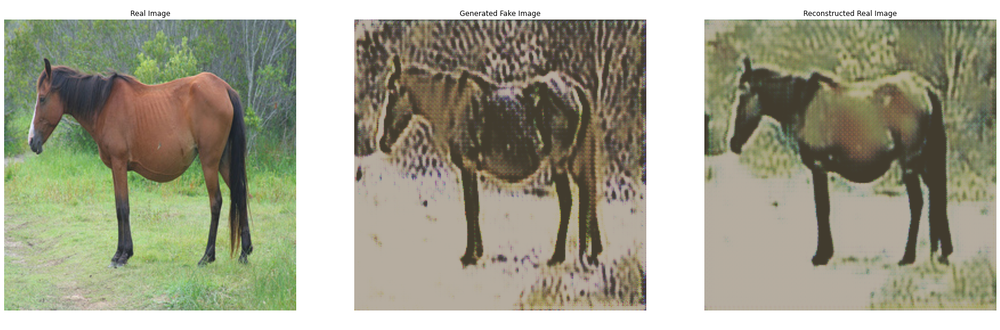

Epoch: (2/50) | Batch: (1/1067) | D_A_Loss: 0.4128 D_B_Loss: 0.7807 | G_A_Loss: 0.8485 G_B_Loss: 0.2217 | C_A_Loss: 5.4291 C_B_Loss: 5.7897 |
Epoch: (2/50) | Batch: (251/1067) | D_A_Loss: 0.2707 D_B_Loss: 0.2233 | G_A_Loss: 0.5934 G_B_Loss: 0.2057 | C_A_Loss: 3.8457 C_B_Loss: 7.4100 |
Epoch: (2/50) | Batch: (501/1067) | D_A_Loss: 0.7132 D_B_Loss: 0.8492 | G_A_Loss: 0.2234 G_B_Loss: 0.3342 | C_A_Loss: 5.3352 C_B_Loss: 4.9640 |
Epoch: (2/50) | Batch: (751/1067) | D_A_Loss: 0.8328 D_B_Loss: 1.1392 | G_A_Loss: 0.2434 G_B_Loss: 0.6169 | C_A_Loss: 4.7584 C_B_Loss: 6.2307 |
Epoch: (2/50) | Batch: (1001/1067) | D_A_Loss: 1.4503 D_B_Loss: 1.8743 | G_A_Loss: 0.1213 G_B_Loss: 0.2606 | C_A_Loss: 4.8356 C_B_Loss: 7.9938 |
Epoch: (2/50) | Batch: (1067/1067) | D_A_Loss: 0.3680 D_B_Loss: 0.4168 | G_A_Loss: 0.4554 G_B_Loss: 0.8496 | C_A_Loss: 4.9002 C_B_Loss: 8.9295 |
Epoch: (3/50) | Batch: (1/1067) | D_A_Loss: 0.9243 D_B_Loss: 0.8526 | G_A_Loss: 0.2839 G_B_Loss: 0.4303 | C_A_Loss: 7.0317 C_B_Loss: 5.7

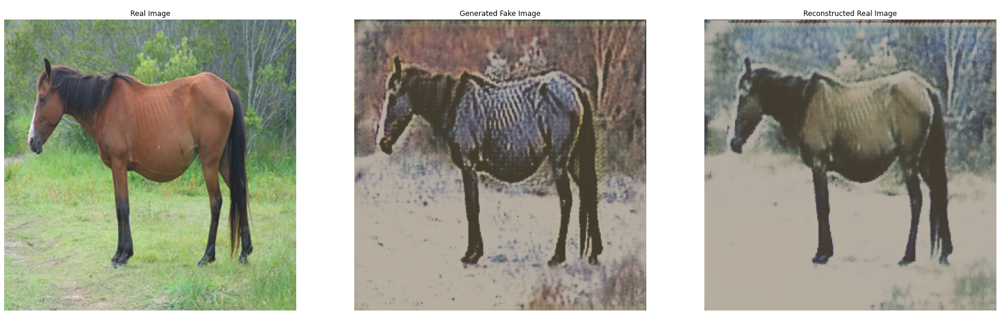

Epoch: (4/50) | Batch: (1/1067) | D_A_Loss: 0.3392 D_B_Loss: 0.2122 | G_A_Loss: 0.7623 G_B_Loss: 0.2942 | C_A_Loss: 10.4585 C_B_Loss: 5.4870 |
Epoch: (4/50) | Batch: (251/1067) | D_A_Loss: 1.1664 D_B_Loss: 0.9645 | G_A_Loss: 0.3092 G_B_Loss: 0.5729 | C_A_Loss: 4.2271 C_B_Loss: 6.0165 |
Epoch: (4/50) | Batch: (501/1067) | D_A_Loss: 0.7787 D_B_Loss: 1.1822 | G_A_Loss: 0.3424 G_B_Loss: 0.6306 | C_A_Loss: 3.1970 C_B_Loss: 5.4315 |
Epoch: (4/50) | Batch: (751/1067) | D_A_Loss: 1.0283 D_B_Loss: 2.3097 | G_A_Loss: 0.0798 G_B_Loss: 0.4242 | C_A_Loss: 4.3943 C_B_Loss: 5.0590 |
Epoch: (4/50) | Batch: (1001/1067) | D_A_Loss: 1.1768 D_B_Loss: 0.1066 | G_A_Loss: 0.6511 G_B_Loss: 0.2048 | C_A_Loss: 6.9381 C_B_Loss: 3.8638 |
Epoch: (4/50) | Batch: (1067/1067) | D_A_Loss: 0.2935 D_B_Loss: 2.5325 | G_A_Loss: 1.5567 G_B_Loss: 0.7402 | C_A_Loss: 7.2040 C_B_Loss: 4.7119 |
Epoch: (5/50) | Batch: (1/1067) | D_A_Loss: 1.1376 D_B_Loss: 0.4323 | G_A_Loss: 0.3237 G_B_Loss: 0.9088 | C_A_Loss: 4.9263 C_B_Loss: 5.

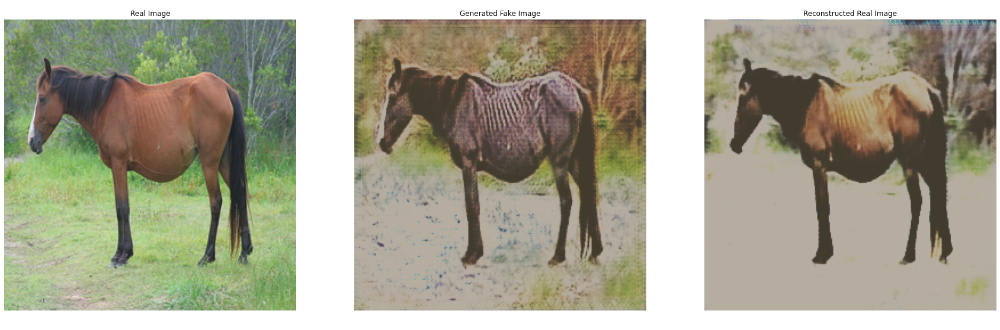

Epoch: (6/50) | Batch: (1/1067) | D_A_Loss: 0.4690 D_B_Loss: 0.4160 | G_A_Loss: 0.6527 G_B_Loss: 0.4247 | C_A_Loss: 5.8101 C_B_Loss: 3.1336 |
Epoch: (6/50) | Batch: (251/1067) | D_A_Loss: 1.1293 D_B_Loss: 3.6102 | G_A_Loss: 0.4507 G_B_Loss: 1.2201 | C_A_Loss: 4.1512 C_B_Loss: 7.7931 |
Epoch: (6/50) | Batch: (501/1067) | D_A_Loss: 0.2322 D_B_Loss: 2.2972 | G_A_Loss: 0.2696 G_B_Loss: 0.5322 | C_A_Loss: 4.4340 C_B_Loss: 2.8138 |
Epoch: (6/50) | Batch: (751/1067) | D_A_Loss: 1.0309 D_B_Loss: 0.4114 | G_A_Loss: 0.4810 G_B_Loss: 0.3461 | C_A_Loss: 2.9048 C_B_Loss: 4.4615 |
Epoch: (6/50) | Batch: (1001/1067) | D_A_Loss: 0.7487 D_B_Loss: 0.4077 | G_A_Loss: 1.2044 G_B_Loss: 0.0445 | C_A_Loss: 6.3817 C_B_Loss: 3.1599 |
Epoch: (6/50) | Batch: (1067/1067) | D_A_Loss: 1.8268 D_B_Loss: 0.3929 | G_A_Loss: 0.4657 G_B_Loss: 0.0584 | C_A_Loss: 5.4950 C_B_Loss: 5.2726 |
Epoch: (7/50) | Batch: (1/1067) | D_A_Loss: 0.3859 D_B_Loss: 0.4458 | G_A_Loss: 1.1004 G_B_Loss: 0.4815 | C_A_Loss: 7.8623 C_B_Loss: 4.0

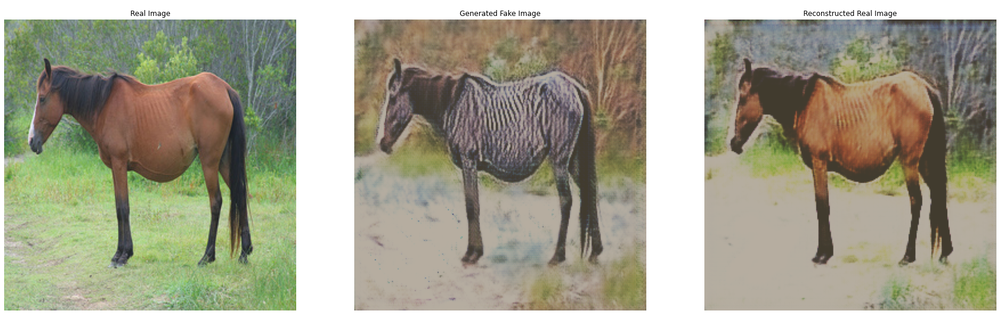

Epoch: (8/50) | Batch: (1/1067) | D_A_Loss: 0.9734 D_B_Loss: 1.8022 | G_A_Loss: 0.1248 G_B_Loss: 0.4495 | C_A_Loss: 3.1895 C_B_Loss: 3.4388 |
Epoch: (8/50) | Batch: (251/1067) | D_A_Loss: 0.4326 D_B_Loss: 0.8620 | G_A_Loss: 0.3036 G_B_Loss: 0.4713 | C_A_Loss: 4.1871 C_B_Loss: 4.9949 |
Epoch: (8/50) | Batch: (501/1067) | D_A_Loss: 0.3512 D_B_Loss: 2.6665 | G_A_Loss: 0.0721 G_B_Loss: 0.3007 | C_A_Loss: 2.6735 C_B_Loss: 6.6101 |
Epoch: (8/50) | Batch: (751/1067) | D_A_Loss: 0.8841 D_B_Loss: 0.1515 | G_A_Loss: 0.5635 G_B_Loss: 0.4404 | C_A_Loss: 3.2034 C_B_Loss: 3.9054 |
Epoch: (8/50) | Batch: (1001/1067) | D_A_Loss: 1.1636 D_B_Loss: 1.0265 | G_A_Loss: 0.3716 G_B_Loss: 0.7207 | C_A_Loss: 5.4366 C_B_Loss: 6.5213 |
Epoch: (8/50) | Batch: (1067/1067) | D_A_Loss: 2.1921 D_B_Loss: 0.1513 | G_A_Loss: 0.4662 G_B_Loss: 0.0739 | C_A_Loss: 5.5431 C_B_Loss: 4.5164 |
Epoch: (9/50) | Batch: (1/1067) | D_A_Loss: 0.2496 D_B_Loss: 0.2521 | G_A_Loss: 0.6031 G_B_Loss: 1.0039 | C_A_Loss: 12.2072 C_B_Loss: 7.

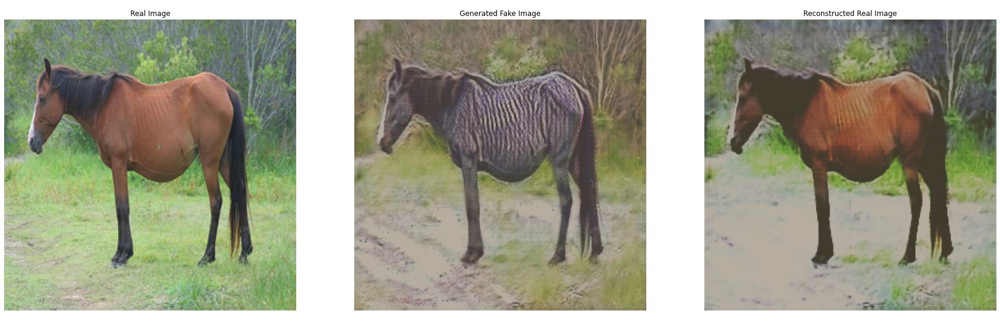

Epoch: (10/50) | Batch: (1/1067) | D_A_Loss: 1.0752 D_B_Loss: 1.0097 | G_A_Loss: 0.7601 G_B_Loss: 0.8455 | C_A_Loss: 3.5859 C_B_Loss: 5.9542 |
Epoch: (10/50) | Batch: (251/1067) | D_A_Loss: 0.7098 D_B_Loss: 0.8998 | G_A_Loss: 0.1734 G_B_Loss: 0.3398 | C_A_Loss: 5.6562 C_B_Loss: 3.4511 |
Epoch: (10/50) | Batch: (501/1067) | D_A_Loss: 0.3379 D_B_Loss: 0.2980 | G_A_Loss: 0.5240 G_B_Loss: 0.7447 | C_A_Loss: 3.6721 C_B_Loss: 4.4983 |
Epoch: (10/50) | Batch: (751/1067) | D_A_Loss: 0.5432 D_B_Loss: 1.8870 | G_A_Loss: 0.4909 G_B_Loss: 0.3083 | C_A_Loss: 2.8419 C_B_Loss: 5.2205 |
Epoch: (10/50) | Batch: (1001/1067) | D_A_Loss: 2.1071 D_B_Loss: 0.0912 | G_A_Loss: 0.4062 G_B_Loss: 0.0879 | C_A_Loss: 2.5771 C_B_Loss: 3.7406 |
Epoch: (10/50) | Batch: (1067/1067) | D_A_Loss: 1.7432 D_B_Loss: 0.1026 | G_A_Loss: 0.2321 G_B_Loss: 0.7510 | C_A_Loss: 2.7637 C_B_Loss: 2.5894 |
Epoch: (11/50) | Batch: (1/1067) | D_A_Loss: 0.3694 D_B_Loss: 0.6547 | G_A_Loss: 0.2913 G_B_Loss: 0.5831 | C_A_Loss: 5.3703 C_B_Lo

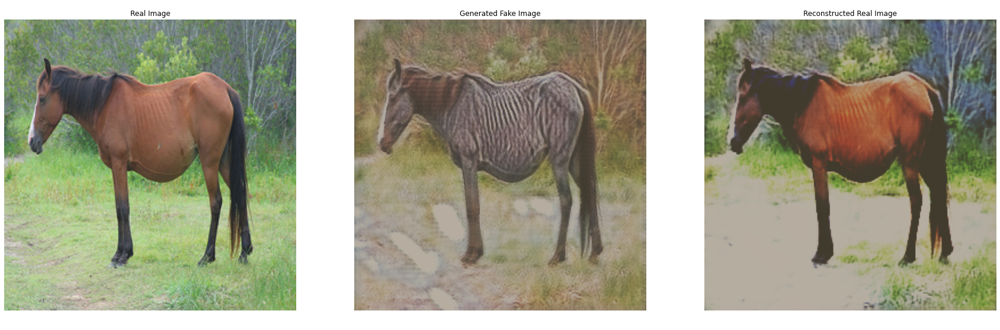

Epoch: (12/50) | Batch: (1/1067) | D_A_Loss: 1.0636 D_B_Loss: 1.4051 | G_A_Loss: 0.2871 G_B_Loss: 0.3999 | C_A_Loss: 3.4972 C_B_Loss: 5.1806 |
Epoch: (12/50) | Batch: (251/1067) | D_A_Loss: 0.3140 D_B_Loss: 0.4189 | G_A_Loss: 0.5292 G_B_Loss: 0.4947 | C_A_Loss: 4.8869 C_B_Loss: 5.7994 |
Epoch: (12/50) | Batch: (501/1067) | D_A_Loss: 1.2982 D_B_Loss: 0.4536 | G_A_Loss: 0.1305 G_B_Loss: 1.5480 | C_A_Loss: 6.4165 C_B_Loss: 4.3985 |
Epoch: (12/50) | Batch: (751/1067) | D_A_Loss: 2.7488 D_B_Loss: 0.4185 | G_A_Loss: 0.1732 G_B_Loss: 0.0960 | C_A_Loss: 4.5753 C_B_Loss: 4.9473 |
Epoch: (12/50) | Batch: (1001/1067) | D_A_Loss: 1.7699 D_B_Loss: 2.7151 | G_A_Loss: 0.2016 G_B_Loss: 0.1627 | C_A_Loss: 2.4131 C_B_Loss: 4.5895 |
Epoch: (12/50) | Batch: (1067/1067) | D_A_Loss: 1.5692 D_B_Loss: 0.4953 | G_A_Loss: 0.9134 G_B_Loss: 0.5330 | C_A_Loss: 5.3533 C_B_Loss: 6.7590 |
Epoch: (13/50) | Batch: (1/1067) | D_A_Loss: 1.0161 D_B_Loss: 0.3301 | G_A_Loss: 0.8473 G_B_Loss: 0.4174 | C_A_Loss: 3.0543 C_B_Lo

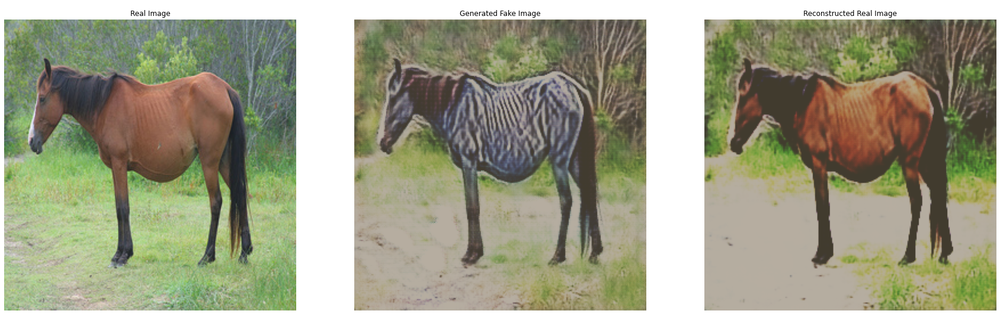

Epoch: (14/50) | Batch: (1/1067) | D_A_Loss: 1.4700 D_B_Loss: 1.1104 | G_A_Loss: 0.0535 G_B_Loss: 0.3083 | C_A_Loss: 3.9635 C_B_Loss: 5.5797 |
Epoch: (14/50) | Batch: (251/1067) | D_A_Loss: 1.2025 D_B_Loss: 0.6280 | G_A_Loss: 0.2377 G_B_Loss: 0.4460 | C_A_Loss: 2.6312 C_B_Loss: 3.7188 |
Epoch: (14/50) | Batch: (501/1067) | D_A_Loss: 1.4555 D_B_Loss: 0.5494 | G_A_Loss: 0.3904 G_B_Loss: 1.0708 | C_A_Loss: 3.1379 C_B_Loss: 2.6392 |
Epoch: (14/50) | Batch: (751/1067) | D_A_Loss: 0.9058 D_B_Loss: 0.6521 | G_A_Loss: 0.4048 G_B_Loss: 0.2693 | C_A_Loss: 4.1060 C_B_Loss: 5.0361 |
Epoch: (14/50) | Batch: (1001/1067) | D_A_Loss: 1.0362 D_B_Loss: 0.2179 | G_A_Loss: 0.5628 G_B_Loss: 0.2542 | C_A_Loss: 2.8403 C_B_Loss: 4.1979 |
Epoch: (14/50) | Batch: (1067/1067) | D_A_Loss: 0.8561 D_B_Loss: 0.1575 | G_A_Loss: 0.5805 G_B_Loss: 0.3462 | C_A_Loss: 5.1904 C_B_Loss: 3.8252 |
Epoch: (15/50) | Batch: (1/1067) | D_A_Loss: 2.0558 D_B_Loss: 0.4204 | G_A_Loss: 0.2559 G_B_Loss: 0.3387 | C_A_Loss: 2.5501 C_B_Lo

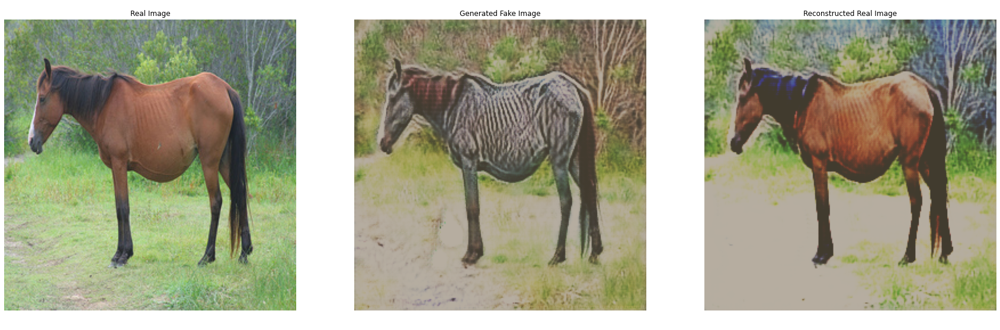

Epoch: (16/50) | Batch: (1/1067) | D_A_Loss: 1.5824 D_B_Loss: 0.9851 | G_A_Loss: 0.3513 G_B_Loss: 0.1712 | C_A_Loss: 2.5870 C_B_Loss: 3.8130 |
Epoch: (16/50) | Batch: (251/1067) | D_A_Loss: 2.3841 D_B_Loss: 1.2808 | G_A_Loss: 0.2094 G_B_Loss: 0.0828 | C_A_Loss: 2.9539 C_B_Loss: 4.8179 |
Epoch: (16/50) | Batch: (501/1067) | D_A_Loss: 2.2313 D_B_Loss: 0.5620 | G_A_Loss: 0.5056 G_B_Loss: 0.2177 | C_A_Loss: 3.4428 C_B_Loss: 4.2327 |
Epoch: (16/50) | Batch: (751/1067) | D_A_Loss: 0.3045 D_B_Loss: 0.1818 | G_A_Loss: 0.8626 G_B_Loss: 0.4875 | C_A_Loss: 3.9693 C_B_Loss: 3.0677 |
Epoch: (16/50) | Batch: (1001/1067) | D_A_Loss: 0.8622 D_B_Loss: 0.7501 | G_A_Loss: 0.7646 G_B_Loss: 0.2786 | C_A_Loss: 2.1201 C_B_Loss: 4.4420 |
Epoch: (16/50) | Batch: (1067/1067) | D_A_Loss: 0.8419 D_B_Loss: 1.0654 | G_A_Loss: 0.3006 G_B_Loss: 0.5037 | C_A_Loss: 4.2694 C_B_Loss: 4.3414 |
Epoch: (17/50) | Batch: (1/1067) | D_A_Loss: 0.2955 D_B_Loss: 0.8266 | G_A_Loss: 0.6154 G_B_Loss: 0.2275 | C_A_Loss: 3.4714 C_B_Lo

In [ ]:
train_mode = 1 # Change to 0 if don't want to train or have already trained
num_epochs = 50

if train_mode:
    D_A_losses = []
    D_B_losses = []
    G_A_losses = []
    G_B_losses = []
    cycle_A_losses = []
    cycle_B_losses = []

    print('!-------------- Start Traning ---------------!')

    for epoch in range(num_epochs):
        # set input
        for i, (batchA, batchB) in enumerate(zip(trainA_dataloader, trainB_dataloader)):
            real_A = batchA[0].to(device)
            real_B = batchB[0].to(device)

            optimizer_G.zero_grad()

            """
            # G_A2B(B) should equal B if real B is fed

            sameB = G_A2B(realB)
            loss_identity_B = criterion_identity(sameB, realB)*5.

            # G_B2A(A) should equal A if real A is fed

            sameA = G_A2B(realA)
            loss_identity_A = criterion_identity(sameA, realA)*5.0
            """
            ##############################
            # GENERATOR
            # GAN loss
            fake_B = G_A2B(real_A)
            detect_fake_B = D_B(fake_B)
            loss_GAN_A2B = criterion_GAN(detect_fake_B, label_generate(1,detect_fake_B.size()))
            
            fake_A = G_B2A(real_B)
            detect_fake_A = D_A(fake_A)
            loss_GAN_B2A = criterion_GAN(detect_fake_A, label_generate(1,detect_fake_A.size()))
            
            # Cycle loss
            cyclic_A = G_B2A(fake_B)
            loss_cycle_ABA = criterion_cycle(cyclic_A, real_A)*10.0

            cyclic_B = G_A2B(fake_A)
            loss_cycle_BAB = criterion_cycle(cyclic_B, real_B)*10.0

            # Total Loss
            loss_G = loss_GAN_A2B + loss_GAN_B2A + loss_cycle_ABA + loss_cycle_BAB
            loss_G.backward()

            optimizer_G.step()

            ##############################
            # DISCRIMINATOR A
            optimizer_D_A.zero_grad()

            # Real loss 
            detect_real_A = D_A(real_A)
            loss_D_real = criterion_GAN(detect_real_A, label_generate(1, detect_real_A.size()))

            # Fake loss
            fake_A = fake_A_buffer.push_and_pop(fake_A)
            detect_fake_A = D_A(fake_A)
            loss_D_fake = criterion_GAN(detect_fake_A, label_generate(0, detect_fake_A.size()))

            # Total loss
            loss_D_A = (loss_D_real + loss_D_fake)*5.0
            loss_D_A.backward()

            optimizer_D_A.step()

            ##############################
            # DISCRIMINATOR B
            optimizer_D_B.zero_grad()

            # Real loss 
            detect_real_B = D_B(real_B)
            loss_D_real = criterion_GAN(detect_real_B, label_generate(1, detect_real_B.size()))

            # Fake loss
            fake_B = fake_B_buffer.push_and_pop(fake_B)
            detect_fake_B = D_B(fake_B)
            loss_D_fake = criterion_GAN(detect_fake_B, label_generate(0, detect_fake_B.size()))

            # Total loss
            loss_D_B = (loss_D_real + loss_D_fake)*5.0
            loss_D_B.backward()

            optimizer_D_B.step()

            D_A_losses.append(loss_D_A.data)
            D_B_losses.append(loss_D_B.data)
            G_A_losses.append(loss_GAN_A2B.data)
            G_B_losses.append(loss_GAN_B2A.data)

            cycle_A_losses.append(loss_cycle_ABA.data)
            cycle_B_losses.append(loss_cycle_BAB.data)

            if i % 250 == 0 or i == len(trainA_dataloader) - 1:
                print("Epoch: ({}/{}) | Batch: ({}/{}) | D_A_Loss: {:.4f} D_B_Loss: {:.4f} | G_A_Loss: {:.4f} G_B_Loss: {:.4f} | C_A_Loss: {:.4f} C_B_Loss: {:.4f} |".format(
                    epoch+1, num_epochs, i+1, len(trainA_dataloader), loss_D_A, loss_D_B, loss_GAN_A2B, loss_GAN_B2A, loss_cycle_ABA, loss_cycle_BAB))
        
        if epoch % 2 == 0 or epoch == num_epochs - 1:
            G_A_save = 'drive/My Drive/GAN/model/generator/D_A_{}.pt'.format(epoch)
            G_B_save = 'drive/My Drive/GAN/model/generator/D_B_{}.pt'.format(epoch)
            torch.save(G_A2B.state_dict(),G_A_save)
            torch.save(G_B2A.state_dict(),G_B_save)
            visualize_train_process(G_A2B, G_B2A, example_img, 'A')
        
        if epoch >= num_epochs - 15:
            optimizer_D_A.param_groups[0]['lr'] -= (0.0002 / 20)
            optimizer_D_B.param_groups[0]['lr'] -= (0.0002 / 20)
            optimizer_G.param_groups[0]['lr'] -= (0.0002 / 20)
            print("Generator's learning rate decay to {}".format(optimizer_G.param_groups[0]['lr']))
    train_mode = 0
    print('!--------------- Complete Training ----------------!')

In [ ]:
print(D_A_losses)

In [ ]:
def plot_losses(D_A_losses, D_B_losses, G_A_losses, G_B_losses, cycle_A_losses, cycle_B_losses):
    fig = plt.figure(figsize = (25, 20))
    fig.add_subplot(2, 1, 1)
    length = len(D_A_losses)
    plt.plot(range(length), D_A_losses, label = 'Discriminator domain A losses')
    plt.plot(range(length), D_B_losses, label = 'Discriminator domain B losses', color = 'green')
    plt.plot(range(length), G_A_losses, label = 'Generator A->B losses', color = 'red')
    plt.plot(range(length), G_B_losses, label = 'Generator B->A losses', color = 'yellow')
    plt.title('Model losses')
    plt.legend()

    fig.add_subplot(2, 1, 2)
    plt.plot(range(length), cycle_A_losses, label = 'Cycle domain A losses')
    plt.plot(range(length), cycle_B_losses, label = 'Cycle domain B losses', color = 'pink')
    plt.title('Cycle losses')
    plt.legend()

    plt.show()

plot_losses(D_A_losses, D_B_losses, G_A_losses, G_B_losses, cycle_A_losses, cycle_B_losses)

In [25]:
# Load model
G_A2B.load_state_dict(torch.load('drive/My Drive/GAN/model/generator/D_A_49.pt',map_location=torch.device('cpu')))
G_B2A.load_state_dict(torch.load('drive/My Drive/GAN/model/generator/D_B_49.pt',map_location=torch.device('cpu')))

test_image_A = Image.open('drive/My Drive/GAN/horse2zebra/horse2zebra/testA/n02381460_7970.jpg')
test_image_B = Image.open('drive/My Drive/GAN/horse2zebra/horse2zebra/testB/n02391049_560.jpg')

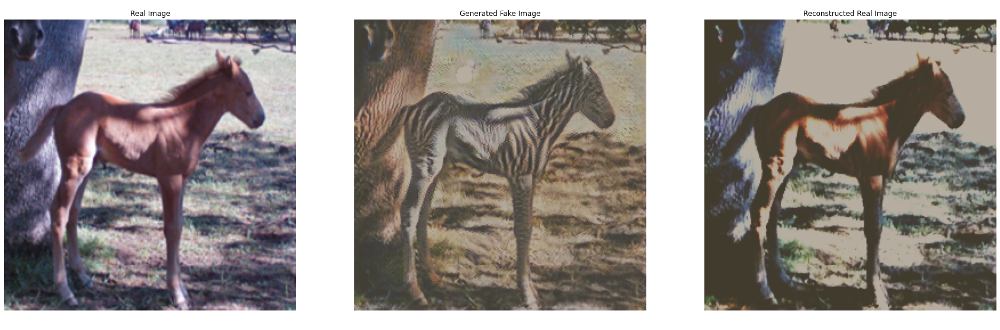

In [26]:
visualize_train_process(G_A2B, G_B2A, test_image_A, 'A')

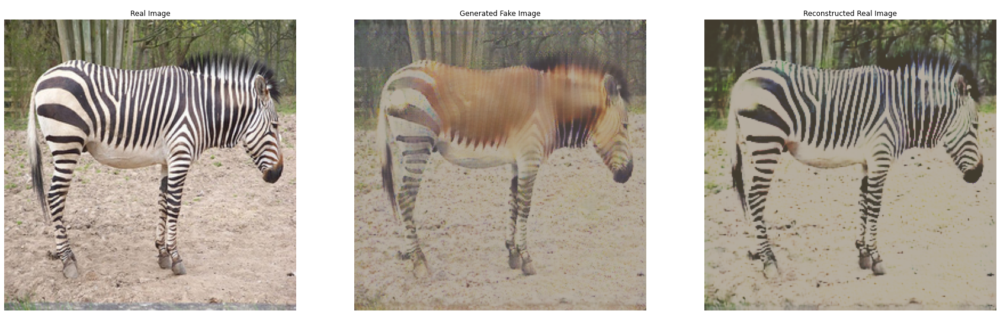

In [27]:
visualize_train_process(G_A2B, G_B2A, test_image_B, 'B')

**We can see that the generated image from B to A is not very good, but i think it can be better if we use more epochs!**